In [1]:
## -- System dependencies --
import sys, os, gc
import torch

## -- Device-Agnostic for GPU --
if torch.cuda.is_available():
    print(f"ℹ️ Device GPU: {torch.cuda.get_device_name(0)}")
    print(f"ℹ️ No. of CPU: {os.cpu_count()} cores")
    # get_ipython().run_line_magic('load_ext', 'cudf.pandas')
    # get_ipython().run_line_magic('load_ext', 'cuml.accel')
    # from cuml.preprocessing import TargetEncoder as cuTE
else:
    print(f"ℹ️ Device: CPU {os.cpu_count()} cores")

ℹ️ Device: CPU 4 cores


In [2]:
## -- Data Manipulation --
import numpy as np, pandas as pd, random

## -- Visualization --
from IPython.display import display, Image
import matplotlib.pyplot as plt
import seaborn as sns

## -- Functional Tools --
import itertools
from time import time, sleep
from tqdm.notebook import tqdm

## -- Machine Learning --
import sklearn
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV

from sklearn.calibration import CalibrationDisplay
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder, LabelEncoder
from sklearn.metrics import roc_auc_score, ConfusionMatrixDisplay, RocCurveDisplay

from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer, make_column_transformer

import warnings
warnings.simplefilter('ignore')
warnings.filterwarnings('ignore')

In [3]:
## -- Global Settings --
sklearn.set_config(transform_output='pandas')

# pd.options.mode.copy_on_write = True
pd.set_option('display.max_columns', 1000)
sns.set_style("whitegrid")
# plt.style.use('ggplot')

## -- Set Configuration --
class CFG:
    FOLDS = 5
    SEED = 42
    GREEN  = '\033[32m'
    YELLOW = '\033[33m'
    RED    = '\033[31m'
    RESET  = '\033[0m'

# plt.rcParams['axes.prop_cycle'] = cycler(color=['red', 'green', 'blue'])
plt.rcParams.update({
    "figure.facecolor": '#0f0f1a', # Outer panel (figure)
    "axes.facecolor":   '#1a1a2e', # Inner panel (image)
    "axes.edgecolor":   '#444466',
    "axes.labelcolor":  '#e0e0ff',
    "text.color":       'lightblue',
    "xtick.color":      '#e0e0ff',
    "ytick.color":      '#e0e0ff',
    "grid.color":       '#2a2a4a',
    "grid.alpha":       0.5,
    "font.family":      'monospace',
})

PALETTE = ['c', 'r', 'darkorange', '#3A86FF', 'y']
sns.set_palette(PALETTE)
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

print(f"CLASSIC {CFG.GREEN} GREEN {CFG.RESET} {CFG.YELLOW} YELLOW {CFG.RESET}")

CLASSIC  GREEN   YELLOW 


In [4]:
## -- ⚠️ IMPORTANT: SELECT PLATFORM ⚠️ --
PLATFORM = 'kaggle' # -> 'colab' 'kaggle'

if PLATFORM == 'kaggle':
    PATH = '/kaggle/input/competitions/playground-series-s6e5/'
    submit = pd.read_csv(PATH+'sample_submission.csv')
    train = pd.read_csv(PATH+"train.csv").drop(columns=['id'])
    test = pd.read_csv(PATH+"test.csv").drop(columns=['id'])
    ORIG_PATH = '/kaggle/input/datasets/aadigupta1601/f1-strategy-dataset-pit-stop-prediction/'
    orig = pd.read_csv(ORIG_PATH+'f1_strategy_dataset_v4.csv')#.drop(['customerID'], axis=1)
elif PLATFORM == 'colab':
    from google.colab import drive
    drive.mount('/content/drive')

    PATH = '/content/drive/MyDrive/--colab--notebooks--/Ps6e5 | F1 Pits Stop/_f1_data/'
    submit = pd.read_csv(PATH+'sample_submission.csv')
    train = pd.read_csv(PATH+'train.csv').drop(columns=['id'])
    test = pd.read_csv(PATH+'test.csv').drop(columns=['id'])
    orig = pd.read_csv(PATH+'f1_strategy_dataset_v4.csv')#.drop(['customerID'], axis=1)

## =================================================================================

TARGET = train.columns[-1]

CATS = [c for c in test.columns if test[c].dtype in ['str', 'object', 'category']]
NUMS = [c for c in test.columns if c not in CATS+[TARGET]]
BASE = NUMS + CATS

orig = orig[train.columns]

for (name, df) in dict(Train=train, Test=test, Original=orig).items():
    print(f"{name} shape: {df.shape}")

print(f"\nTotal Nums: {len(NUMS)}")
print(f"Total Cats: {len(CATS)}")
print(f"Total Base: {len(BASE)}")

# cast_int = ['PitStop', 'Stint', 'LapNumber', 'Position']
# for df in [train, test, orig]:
#     df[cast_int] = df[cast_int].astype('int8')

train[TARGET] = train[TARGET].astype(int)
orig[TARGET]  = orig[TARGET].astype(int)

Train shape: (439140, 15)
Test shape: (188165, 14)
Original shape: (101371, 15)

Total Nums: 11
Total Cats: 3
Total Base: 14


In [5]:
display(train.head())
train.info()

,Driver,Compound,Race,Year,PitStop,LapNumber,Stint,TyreLife,Position,LapTime (s),LapTime_Delta,Cumulative_Degradation,RaceProgress,Position_Change,PitNextLap
0,D109,HARD,Canadian Grand Prix,2022,0,50,2,39.0,8,78.491,-7.564,21.019,0.714286,5.0,1
1,D086,HARD,Dutch Grand Prix,2025,1,27,2,7.0,4,75.095,-32.617,-223.207,0.346154,-3.0,0
2,ZON,HARD,Austrian Grand Prix,2022,0,59,3,22.0,13,70.945,-7.540,-100.529,0.819444,3.0,1
3,SPE,MEDIUM,Pre-Season Testing,2023,0,2,1,2.0,7,94.361,-7.324,-7.324,0.076923,0.0,0
4,D019,HARD,Azerbaijan Grand Prix,2022,1,26,3,6.0,2,107.878,8.965,-14.139,0.361111,3.0,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 439140 entries, 0 to 439139
Data columns (total 15 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Driver                  439140 non-null  object 
 1   Compound                439140 non-null  object 
 2   Race                    439140 non-null  object 
 3   Year                    439140 non-null  int64  
 4   PitStop                 439140 non-null  int64  
 5   LapNumber               439140 non-null  int64  
 6   Stint                   439140 non-null  int64  
 7   TyreLife                439140 non-null  float64
 8   Position                439140 non-null  int64  
 9   LapTime (s)             439140 non-null  float64
 10  LapTime_Delta           439140 non-null  float64
 11  Cumulative_Degradation  439140 non-null  float64
 12  RaceProgress            439140 non-null  float64
 13  Position_Change         439140 non-null  float64
 14  PitNextLap          

In [6]:
train[NUMS].describe()

,Year,PitStop,LapNumber,Stint,TyreLife,Position,LapTime (s),LapTime_Delta,Cumulative_Degradation,RaceProgress,Position_Change
count,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000
mean,2023.523544,0.136118,23.105909,1.789113,14.158231,9.630339,90.948735,-3.770040,-25.721759,0.337661,0.101542
std,1.024930,0.342915,16.958261,0.950194,9.801338,5.278770,19.772769,43.945759,54.766573,0.253277,4.006765
min,2022.000000,0.000000,1.000000,1.000000,1.000000,1.000000,67.694000,-2403.895000,-274.564000,0.012821,-18.000000
25%,2023.000000,0.000000,9.000000,1.000000,6.000000,5.000000,82.621000,-8.884000,-46.566250,0.129870,-1.000000
50%,2024.000000,0.000000,19.000000,2.000000,12.000000,10.000000,90.521000,-0.295000,-20.994000,0.269231,0.000000
75%,2024.000000,0.000000,36.000000,2.000000,20.000000,14.000000,98.471000,0.115000,-6.199000,0.513158,2.000000
max,2025.000000,1.000000,78.000000,8.000000,77.000000,20.000000,2507.607000,2423.932000,2412.026000,1.000000,18.000000


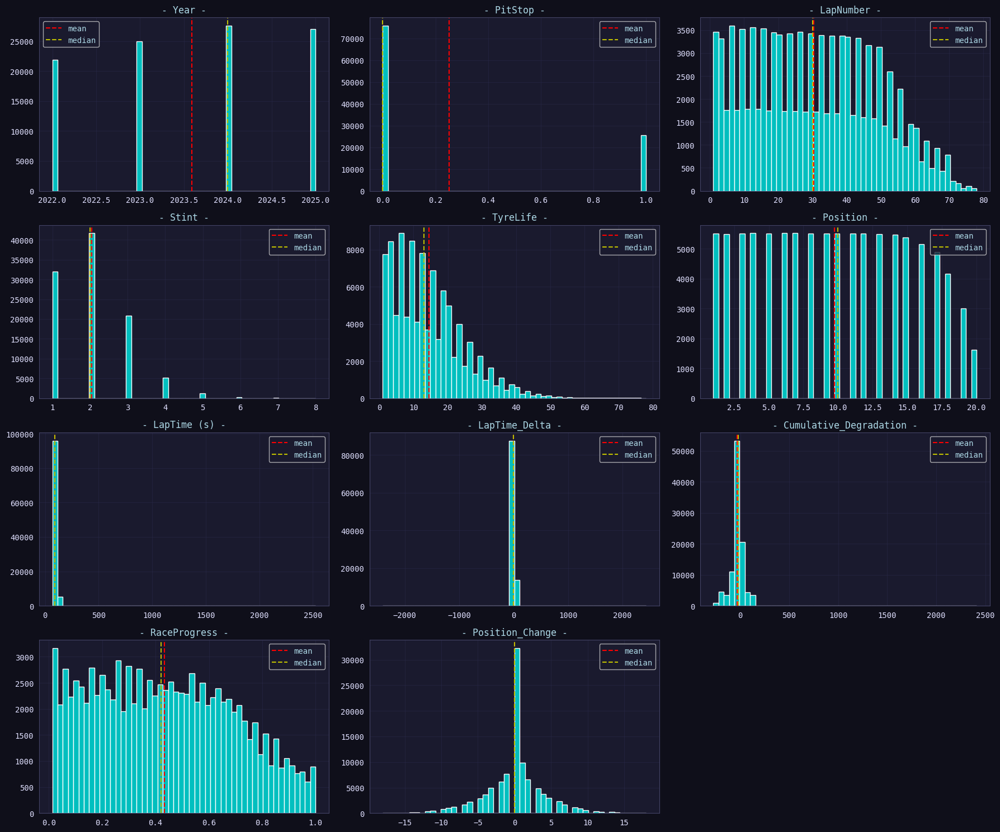

In [7]:
plt.figure(figsize=(18, 15))

for i, col in enumerate(NUMS):
    plt.subplot(4, 3, i+1)
    ax = plt.hist(orig[col], bins=50)
    plt.axvline(x=orig[col].mean(), color='r', linestyle='--', label='mean')
    plt.axvline(x=orig[col].median(), color='y', linestyle='--', label='median')
    plt.title(f'- {col} -')
    plt.legend()

plt.tight_layout()
plt.show()

In [8]:
## -- Unique value counts for each dataset --
TRAIN_UNIQUE = {}
ORIGINAL_UNIQUE = {}
TEST_UNIQUE = {}

for col in BASE:
    TRAIN_UNIQUE[col] = train[col].nunique()
    ORIGINAL_UNIQUE[col] = orig[col].nunique()
    TEST_UNIQUE[col] = test[col].nunique()

unique_counts_df = pd.concat(
        [pd.DataFrame(TRAIN_UNIQUE, index=['Train']),
         pd.DataFrame(ORIGINAL_UNIQUE, index=['Original']),
         pd.DataFrame(TEST_UNIQUE, index=['Test'])],
    )

unique_counts_df.style.background_gradient()

,Year,PitStop,LapNumber,Stint,TyreLife,Position,LapTime (s),LapTime_Delta,Cumulative_Degradation,RaceProgress,Position_Change,Driver,Compound,Race
Train,4,2,78,8,78,20,37719,57532,142701,1898,37,887,5,26
Original,4,2,78,8,78,20,40779,54084,81360,1437,37,31,5,28
Test,4,2,77,8,77,20,30286,40673,86823,1556,37,801,5,26


In [9]:
n_unique = train[BASE].nunique().sort_values()
n_unique

PitStop                        2
Year                           4
Compound                       5
Stint                          8
Position                      20
Race                          26
Position_Change               37
LapNumber                     78
TyreLife                      78
Driver                       887
RaceProgress                1898
LapTime (s)                37719
LapTime_Delta              57532
Cumulative_Degradation    142701
dtype: int64

# FEATURE ENGINEERING

In [10]:
## -- EXTRACTIONS & BINNING --
ROUNDS = []
DIGITS = []
E_BINS = []
Q_BINS = []
DROP_COLS = []

round_thresh = 3
digit_thresh = 2

round_thresh, digit_thresh

(3, 2)

In [11]:
# _extract_cols = ['Cumulative_Degradation', 'LapTime (s)'] # , 'LapTime_Delta'

# print(f"\nRounding... ", end='')
# for col in _extract_cols:
#     for r in range(-2, 3):
#         r_n = f"{col}_round_{r}"
#         print(r_n+', ', end='')
#         train[r_n] = train[col].round(r).astype('int32')
#         test[r_n]  = test[col].round(r).astype('int32')
#         orig[r_n]  = orig[col].round(r).astype('int32')

#         ## -- Drop irrelevant features --
#         if train[r_n].nunique() < round_thresh or train[r_n].nunique() == train[col].nunique():
#             DROP_COLS.append(r_n)
#         else:
#             ROUNDS.append(r_n)

#     # print(f"\nDIGITS... ", end='')
#     # for d in range(-3, 4):
#     #     d_n = f'{col}_digit_{d}'
#     #     print(d_n+', ', end='')
#     #     train[d_n] = ((train[col] * 10**d) % 10).fillna(-1).astype('int8')
#     #     test[d_n]  = ((test[col]  * 10**d) % 10).fillna(-1).astype('int8')
#     #     orig[d_n]  = ((orig[col]  * 10**d) % 10).fillna(-1).astype('int8')

#     #     ## -- Drop constant features --
#     #     if train[d_n].nunique() < digit_thresh:
#     #         DROP_COLS.append(d_n)
#     #     else:
#     #         DIGITS.append(d_n)

#     # print(f"\nCreating value-based E_BINS... ", end='')
#     # for b in [100]:
#     #     b_n = f'{col}_bin_{b}'
#     #     print(b_n+', ', end='')
#     #     train[b_n], edges = pd.cut(train[col], bins=b, retbins=True, include_lowest=True, labels=False)
#     #     test[b_n] = pd.cut(test[col], bins=edges, include_lowest=True, labels=False)
#     #     orig[b_n] = pd.cut(orig[col], bins=edges, include_lowest=True, labels=False)
#     #     E_BINS.append(b_n)

#     # print(f"\nCreating quantile-based Q_BINS... ", end='')
#     # for q in [100]:
#     #     q_n = f'{col}_Qbin_{q}'
#     #     print(q_n+', ', end='')
#     #     train[q_n], edges = pd.qcut(train[col], q=q, retbins=True, duplicates='drop', labels=False)
#     #     test[q_n] = pd.cut(test[col], bins=edges, include_lowest=True, labels=False)
#     #     orig[q_n] = pd.cut(orig[col], bins=edges, include_lowest=True, labels=False)
#     #     Q_BINS.append(q_n)

# print()
# print('-'*40)
# print(f'✅ Total ROUNDS: {len(ROUNDS)}')
# print(f"✅ Total DIGITS: {len(DIGITS)}")
# print(f"✅ Total E_BINS: {len(E_BINS)}")
# print(f"✅ Total Q_BINS: {len(Q_BINS)}")

In [12]:
# for col in ['RaceProgress', 'TyreLife', 'LapNumber']:
#     # print(f"\nRounding... ", end='')
#     # for r in range(1, 6):
#     #     r_n = f"{col}_round_{r}"
#     #     print(r_n+', ', end='')
#     #     train[r_n] = train[col].round(r).astype('int32')
#     #     test[r_n]  = test[col].round(r).astype('int32')
#     #     orig[r_n]  = orig[col].round(r).astype('int32')
#     #     ## -- Drop irrelevant features --
#     #     if train[r_n].nunique() < round_thresh or train[r_n].nunique() == train[col].nunique():
#     #         DROP_COLS.append(r_n)
#     #     else:
#     #         ROUNDS.append(r_n)

#     # print(f"\nDIGITS... ", end='')
#     # for d in [0, 1, 2, 3, 4, 5, 6]:
#     #     d_n = f'{col}_digit_{d}'
#     #     print(d_n+', ', end='')
#     #     train[d_n] = ((train[col] * 10**d) % 10).fillna(-1).astype('int8')
#     #     test[d_n]  = ((test[col]  * 10**d) % 10).fillna(-1).astype('int8')
#     #     orig[d_n]  = ((orig[col]  * 10**d) % 10).fillna(-1).astype('int8')
#     #     ## -- Drop constant features --
#     #     if train[d_n].nunique() < digit_thresh:
#     #         DROP_COLS.append(d_n)
#     #     else:
#     #         DIGITS.append(d_n)

#     # print(f"\nCreating value-based E_BINS... ", end='')
#     # for b in [10]:
#     #     b_n = f'{col}_Ebin_{b}'
#     #     print(b_n+', ', end='')
#     #     train[b_n], edges = pd.cut(train[col], bins=b, retbins=True, include_lowest=True, labels=False)
#     #     test[b_n] = pd.cut(test[col], bins=edges, include_lowest=True, labels=False)
#     #     orig[b_n] = pd.cut(orig[col], bins=edges, include_lowest=True, labels=False)
#     #     E_BINS.append(b_n)

#     print(f"\nCreating quantile-based Q_BINS... ", end='')
#     for q in [10]:
#         q_n = f'{col}_Qbin_{q}'
#         print(q_n+', ', end='')
#         train[q_n], edges = pd.qcut(train[col], q=q, retbins=True, duplicates='drop', labels=False)
#         test[q_n] = pd.cut(test[col], bins=edges, include_lowest=True, labels=False)
#         orig[q_n] = pd.cut(orig[col], bins=edges, include_lowest=True, labels=False)
#         Q_BINS.append(q_n)

# print()
# print('-'*40)
# print(f'✅ Total ROUNDS: {len(ROUNDS)}')
# print(f"✅ Total DIGITS: {len(DIGITS)}")
# print(f"✅ Total E_BINS: {len(E_BINS)}")
# print(f"✅ Total Q_BINS: {len(Q_BINS)}")

In [13]:
# train = train.drop(columns=DROP_COLS)
# test  = test.drop(columns=DROP_COLS)
# orig  = orig.drop(columns=DROP_COLS)

# print(f"Features dropped: {DROP_COLS}")

# train[ROUNDS+DIGITS+E_BINS+Q_BINS].nunique()

In [14]:
# def add_frequency_condition(df1, cols, thresh=5): 
#     df = df1.copy()
#     for c in cols:
#         v_counts = df[c].value_counts()
#         to_replace = v_counts[v_counts <= thresh].index
#         df[c] = np.where(df[c].isin(to_replace), -1, df[c])

#     return df

# train = add_frequency_condition(train, DIGITS+ROUNDS, thresh=5)
# test  = add_frequency_condition(test,  DIGITS+ROUNDS, thresh=5)
# orig  = add_frequency_condition(orig,  DIGITS+ROUNDS, thresh=5)

# print(f"Frequency threshold imputed!")

In [15]:
INTER = []
top_cols = ['Year', 'Compound', 'Stint', 'Race', 'PitStop'] 
low_cols = ['Driver', 'Position', 'Position_Change', 'LapNumber', 'TyreLife']

for c1, c2 in tqdm(list(itertools.combinations(top_cols, 2)), desc='Pairwise'):
    n_col = f"Bi_{c1}-|-{c2}"
    train[n_col] = train[c1].astype(str) + '_' + train[c2].astype(str)
    test[n_col]  = test[c1].astype(str) + '_' + test[c2].astype(str)
    orig[n_col]  = orig[c1].astype(str) + '_' + orig[c2].astype(str)
    INTER.append(n_col)

# for c1, c2, c3 in tqdm(list(itertools.combinations(top_cols, 3)), desc='Triplewise'):
#     n_col = f"Tri_{c1}-|-{c2}-|-{c3}"
#     train[n_col] = train[c1].astype(str) + '_' + train[c2].astype(str) + '_' + train[c3].astype(str)
#     test[n_col]  = test[c1].astype(str) + '_' + test[c2].astype(str) + '_' + test[c3].astype(str)
#     orig[n_col]  = orig[c1].astype(str) + '_' + orig[c2].astype(str) + '_' + test[c3].astype(str)
#     INTER.append(n_col)

# for c1, c2 in tqdm(list(itertools.product(top_cols, low_cols)), desc='One-to-Many'):
#     n_col = f"Bi_{c1}-|-{c2}"
#     train[n_col] = train[c1].astype(str) + '_' + train[c2].astype(str)
#     test[n_col]  = test[c1].astype(str) + '_' + test[c2].astype(str)
#     orig[n_col]  = orig[c1].astype(str) + '_' + orig[c2].astype(str)
#     INTER.append(n_col)

print(f"Total Interaction Features: {len(INTER)}")

Pairwise:   0%|          | 0/10 [00:00<?, ?it/s]

Total Interaction Features: 10


In [16]:
# def FE(df1):
#     """
#     Comprehensive feature engineering for F1 Pit Stop prediction.
#     Focuses on: 
#     1. Fuel-corrected LapTimes
#     2. Stint-relative degradation
#     3. Track-specific strategic windows
#     """
#     df = df1.copy()
#     print('Feature engineering... ', end='')
#     # Sort for temporal consistency
#     df = df.sort_values(by=['Year', 'Race', 'Driver', 'LapNumber'])
    
#     # --- 1. LAPTIME TRANSFORMATION & FUEL CORRECTION ---
#     # F1 cars gain ~0.035s per lap due to fuel burn. 
#     # This 'normalizes' LapTime across the race duration.
#     df['Fuel_Corrected_LapTime'] = df['LapTime (s)'] + (df['LapNumber'] * 0.035)
    
#     # Group by stint for relative performance
#     stint_group = df.groupby(['Year', 'Race', 'Driver', 'Stint'])
    
#     # Relative pace: How much have we slowed since the start of THIS stint?
#     df['Stint_Min_LapTime'] = stint_group['LapTime (s)'].transform('min')
#     df['Pace_Loss_Stint'] = df['LapTime (s)'] - df['Stint_Min_LapTime']
    
#     # Rolling Volatility: High variance often precedes a pit (tire instability)
#     df['LapTime_Volatility_3L'] = df.groupby(['Year', 'Race', 'Driver'])['LapTime (s)'].transform(
#         lambda x: x.rolling(window=3, min_periods=1).std()
#     )
#     df['LapTime_Volatility_3L'] = df['LapTime_Volatility_3L'].fillna(0)

#     # --- 2. TIRE DEGRADATION DYNAMICS ---
#     # Calculate the 'acceleration' of wear (the second derivative)
#     df['Degradation_Rate'] = df.groupby(['Year', 'Race', 'Driver'])['Cumulative_Degradation'].diff()
#     df['Degradation_Acc'] = df.groupby(['Year', 'Race', 'Driver'])['Degradation_Rate'].diff()
#     df['Degradation_Rate'] = df['Degradation_Rate'].fillna(0)
#     df['Degradation_Acc'] = df['Degradation_Acc'].fillna(0)

#     # Compound Logic: Normalizing life based on typical compound limits
#     compound_max = {'SOFT': 18, 'MEDIUM': 32, 'HARD': 48}
#     df['Tyre_Life_Pct'] = df.apply(
#         lambda x: x['TyreLife'] / compound_max.get(x['Compound'], 30), axis=1
#     )

#     # --- 3. STRATEGIC WINDOWS (Target/Mean Encoding) ---
#     # Binning LapNumbers to find the 'High Probability' windows per race
#     # df['Lap_Bin'] = pd.cut(df['LapNumber'], bins=10, labels=False)
    
#     # Historical probability of pitting in this specific window at this specific track
#     # Note: In a real CV, this should be done within the fold to avoid leakage
#     # df['Race_Window_Prob'] = df.groupby(['Race', 'Lap_Bin'])['PitNextLap'].transform('mean')
    
#     # Compound-Stint interaction: Captures if it's a 'common' stop time
#     # df['Compound_Stint_Prob'] = df.groupby(['Compound', 'Stint'])['PitNextLap'].transform('mean')

#     # --- 4. POSITION & CONTEXT ---
#     # Net position change over last 3 laps (Pressure metric)
#     df['Recent_Pos_Change'] = df.groupby(['Year', 'Race', 'Driver'])['Position_Change'].transform(
#         lambda x: x.rolling(window=3, min_periods=1).sum()
#     )
    
#     # --- 5. CLEANUP FOR MODELS ---
#     # Fill temporal gaps with neutral values
    
#     # # Drop redundancy: 0.98 correlation between LapNumber and RaceProgress
#     # # RaceProgress is usually better for GBDTs/NNs as it's already 0-1 scaled.
#     # if 'LapNumber' in df.columns:
#     #     df_final = df.drop(columns=['LapNumber'])
#     # else:
#     #     df_final = df

#     print('Complete!')

#     return df

In [17]:
# train = FE(train)
# test  = FE(test)
# orig  = FE(orig)

In [18]:
## -- Arithmetic interactions --
for df in [train, test, orig]:
    df['_LapNumber_div_RacePro'] = (df['LapNumber'] / (df['RaceProgress'] + 1e-6)).astype('float32')
    df['_TyreLife_div_LapNum'] = (df['TyreLife'] / df['LapNumber'].clip(lower=1)).astype('float32')
    # df['_lapTime_s_*_Cum_Deg'] = (df['LapTime (s)'] * df['Cumulative_Degradation']).astype('float32')
    df['_LapTime_s_*_Cum_abs'] = (df['LapTime (s)'] * df['Cumulative_Degradation'].abs()).astype('float32')
    df['_LapTime_s_div_Cum_abs'] = (df['LapTime (s)'] / (df['Cumulative_Degradation'].abs() + 1e-6)).astype('float32')

arithmetic = [
    '_LapNumber_div_RacePro',
    '_TyreLife_div_LapNum',
    # '_lapTime_s_*_Cum_Deg',
    '_LapTime_s_*_Cum_abs',
    '_LapTime_s_div_Cum_abs',
]

print(f"Total Arithmetic interactions: {len(arithmetic)}")

train[arithmetic].head()

Total Arithmetic interactions: 4


,_LapNumber_div_RacePro,_TyreLife_div_LapNum,_LapTime_s_*_Cum_abs,_LapTime_s_div_Cum_abs
0,69.999901,0.780000,1649.802368,3.734288
1,77.999771,0.259259,16761.730469,0.336437
2,71.999908,0.372881,7132.029785,0.705717
3,25.999662,1.000000,691.099976,12.883805
4,71.999802,0.230769,1525.286987,7.629817


In [19]:
## -- Frequency encoding --
freq_cols = []

print(f"\nCreating frequencies... ", end='')
for col in CATS: #  + arithmetic[:2] + ['RaceProgress']  
    freq = pd.concat([train[col], orig[col], test[col]]).value_counts(normalize=True)
    n = f'{col}_freq'
    print(f"{n}.. ", end='')
    for df in [train, test, orig]:
        df[n] = df[col].map(freq).fillna(0).astype('float32')
    freq_cols.append(n)

print(f"\n✓ Total frequency features: {len(freq_cols)}")
train[freq_cols].describe()


Creating frequencies... Driver_freq.. Compound_freq.. Race_freq.. 
✓ Total frequency features: 3


,Driver_freq,Compound_freq,Race_freq
count,439140.000000,439140.000000,439140.000000
mean,0.002632,0.387627,0.041934
std,0.001749,0.125573,0.009372
min,0.000001,0.003187,0.007622
25%,0.001857,0.395496,0.035389
50%,0.002684,0.395496,0.043022
75%,0.002854,0.466199,0.048945
max,0.010526,0.466199,0.055289


In [20]:
# ## -- Cyclic encoding --
# for df in [train, test, orig]:
#     for p in [12, 30]:
#         df[f"MonthlyCharges_sin_{p}"] = np.sin(2 * np.pi * df['MonthlyCharges'] / p).astype('float32')
#         df[f"MonthlyCharges_cos_{p}"] = np.cos(2 * np.pi * df['MonthlyCharges'] / p).astype('float32')

In [21]:
from sklearn.base import BaseEstimator, TransformerMixin ## ===== Target/Category Mean ENCODERS =====

class TargetEncoder(BaseEstimator, TransformerMixin):
    """
    Target Encoder that supports multiple aggregation functions,
    internal cross-validation for leakage prevention, and smoothing.

    Parameters
    ----------
    cols_to_encode : list of str
        List of column names to be target encoded.

    aggs : list of str, default=['mean']
        List of aggregation functions to apply. Any function accepted by
        pandas' `.agg()` method is supported, such as:
        'mean', 'std', 'var', 'min', 'max', 'skew', 'nunique', 
        'count', 'sum', 'median'.
        Smoothing is applied only to the 'mean' aggregation.

    cv : int, default=5
        Number of folds for cross-validation in fit_transform.

    smooth : float or 'auto', default='auto'
        The smoothing parameter `m`. A larger value puts more weight on the 
        global mean. If 'auto', an empirical Bayes estimate is used.
        
    drop_original : bool, default=False
        If True, the original columns to be encoded are dropped.
    """
    def __init__(self, cols_to_encode, aggs=['mean'], cv=5, smooth='auto', drop_original=False):
        self.cols_to_encode = cols_to_encode
        self.aggs = aggs
        self.cv = cv
        self.smooth = smooth
        self.drop_original = drop_original
        self.mappings_ = {}
        self.global_stats_ = {}

    def fit(self, X, y):
        """
        Learn mappings from the entire dataset.
        These mappings are used for the transform method on validation/test data.
        """
        temp_df = X.copy()
        temp_df['target'] = y

        # Learn global statistics for each aggregation
        for agg_func in self.aggs:
            self.global_stats_[agg_func] = y.agg(agg_func)

        # Learn category-specific mappings
        for col in self.cols_to_encode:
            self.mappings_[col] = {}
            for agg_func in self.aggs:
                mapping = temp_df.groupby(col)['target'].agg(agg_func)
                self.mappings_[col][agg_func] = mapping
        
        return self

    def transform(self, X):
        """
        Apply learned mappings to the data.
        Unseen categories are filled with global statistics.
        """
        X_transformed = X.copy()
        for col in self.cols_to_encode:
            for agg_func in self.aggs:
                new_col_name = f'TE_{col}_{agg_func}'
                map_series = self.mappings_[col][agg_func]
                X_transformed[new_col_name] = X[col].map(map_series)
                X_transformed[new_col_name].fillna(self.global_stats_[agg_func], inplace=True)
        
        if self.drop_original:
            X_transformed.drop(columns=self.cols_to_encode, inplace=True)
            
        return X_transformed

    def fit_transform(self, X, y):
        """
        Fit and transform the data using internal cross-validation to prevent leakage.
        """
        # First, fit on the entire dataset to get global mappings for transform method
        self.fit(X, y)

        # Initialize an empty DataFrame to store encoded features
        encoded_features = pd.DataFrame(index=X.index)
        
        kf = KFold(n_splits=self.cv, shuffle=True, random_state=42)

        for train_idx, val_idx in kf.split(X, y):
            X_train, y_train = X.iloc[train_idx], y.iloc[train_idx]
            X_val = X.iloc[val_idx]
            
            temp_df_train = X_train.copy()
            temp_df_train['target'] = y_train

            for col in self.cols_to_encode:
                # --- Calculate mappings only on the training part of the fold ---
                for agg_func in self.aggs:
                    new_col_name = f'TE_{col}_{agg_func}'
                    
                    # Calculate global stat for this fold
                    fold_global_stat = y_train.agg(agg_func)
                    
                    # Calculate category stats for this fold
                    mapping = temp_df_train.groupby(col)['target'].agg(agg_func)

                    # --- Apply smoothing only for 'mean' aggregation ---
                    if agg_func == 'mean':
                        counts = temp_df_train.groupby(col)['target'].count()
                        
                        m = self.smooth
                        if self.smooth == 'auto':
                            # Empirical Bayes smoothing
                            variance_between = mapping.var()
                            avg_variance_within = temp_df_train.groupby(col)['target'].var().mean()
                            if variance_between > 0:
                                m = avg_variance_within / variance_between
                            else:
                                m = 0  # No smoothing if no variance between groups
                        
                        # Apply smoothing formula
                        smoothed_mapping = (counts * mapping + m * fold_global_stat) / (counts + m)
                        encoded_values = X_val[col].map(smoothed_mapping)
                    else:
                        encoded_values = X_val[col].map(mapping)
                    
                    # Store encoded values for the validation fold
                    encoded_features.loc[X_val.index, new_col_name] = encoded_values.fillna(fold_global_stat)

        # Merge with original DataFrame
        X_transformed = X.copy()
        for col in encoded_features.columns:
            X_transformed[col] = encoded_features[col]
            
        if self.drop_original:
            X_transformed.drop(columns=self.cols_to_encode, inplace=True)
            
        return X_transformed


class CategoryMeanTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, cat_cols=None):
        self.cat_cols = cat_cols
        self.mappings_ = {}
    def fit(self, X, y):
        X = X.copy()
        if self.cat_cols is None:
            self.cat_cols = X.select_dtypes(include=['category']).columns.tolist()
        self.mappings_ = {}
        for col in self.cat_cols:
            df_temp = pd.DataFrame({col: X[col], 'y': y})
            group_means = df_temp.groupby(col, dropna=False)['y'].mean()
            sorted_categories = group_means.sort_values().index
            self.mappings_[col] = {cat: i for i, cat in enumerate(sorted_categories)}
        return self

    def transform(self, X, y=None):
        X = X.copy()
        for col, mapping in self.mappings_.items():
            if col in X.columns:
                X[col] = X[col].map(mapping)
        return X

In [22]:
def orig_TE_data_propagate(
    orig: pd.DataFrame,
    X_train: pd.DataFrame,
    X_val: pd.DataFrame,
    X_test: pd.DataFrame,
    features: list=None,
    target: str=None,
    aggs: list=None,
    fill_nan: bool=False,
):

    if features is None or len(features) == 0:
        return X_train.copy(), X_val.copy(), X_test.copy(), []

    if aggs is None or len(aggs) == 0:
        return X_train.copy(), X_val.copy(), X_test.copy(), []

    X_train_df = X_train.copy()
    X_val_df   = X_val.copy()
    X_test_df  = X_test.copy()
    ORIG = []

    maps = {}

    valid_features = [col for col in features if col in orig.columns]

    for col in tqdm(valid_features, desc='TE_merging'):
        for agg_ in aggs:
            agg_key = agg_.lower()
            new_col = f"OTE_{col}_{agg_key}"

            map_key = (col, agg_key)
            if map_key not in maps:
                try:
                    if agg_key == 'mean':
                        map_df = (orig.groupby(col)[target].mean().reset_index(name=new_col))
                    elif agg_key == 'median':
                        map_df = (orig.groupby(col)[target].median().reset_index(name=new_col))
                    elif agg_key == 'count':
                        map_df = (orig.groupby(col).size().reset_index(name=new_col))
                    elif agg_key == 'nunique':
                        map_df = (orig.groupby(col)[target].nunique().reset_index(name=new_col))
                    elif agg_key == 'std':
                        map_df = (orig.groupby(col)[target].std().reset_index(name=new_col))
                    elif agg_key == 'skew':
                        map_df = (orig.groupby(col)[target].skew().reset_index(name=new_col))
                    elif agg_key == 'max':
                        map_df = (orig.groupby(col)[target].max().reset_index(name=new_col))
                    elif agg_key == 'min':
                        map_df = (orig.groupby(col)[target].min().reset_index(name=new_col))
                    else:
                        continue
                except Exception as e:
                    print(f"Warning: failed to create map for col={col}, agg={agg_}: {e}")
                    continue

                maps[map_key] = map_df

            map_df = maps.get(map_key)
            if map_df is None:
                continue

            # Merge maps into each split
            X_train_df = X_train_df.merge(map_df, on=col, how='left')
            X_val_df   = X_val_df.merge(map_df, on=col, how='left')
            X_test_df  = X_test_df.merge(map_df, on=col, how='left')

            ORIG.append(new_col)

    global_mean   = orig[target].mean()
    global_median = orig[target].median()
    
    def fill_conditionally(df):
        for c in ORIG:
            if '_mean' in c or '_max' in c or '_min' in c:
                df[c] = df[c].fillna(global_mean)
            elif '_median' in c:
                df[c] = df[c].fillna(global_median)
            else:
                df[c] = df[c].fillna(0)
        return df

    if fill_nan:
        X_train_df = fill_conditionally(X_train_df)
        X_val_df   = fill_conditionally(X_val_df)
        X_test_df  = fill_conditionally(X_test_df)

    return X_train_df, X_val_df, X_test_df, ORIG

In [23]:
# train, test, _, orig_cols = orig_TE_data_propagate(
#     orig,
#     train,
#     test,
#     train.iloc[:500],
#     features=BASE,
#     target=TARGET,
#     aggs=['mean'],
#     # mean, median, count, std, skew, nunique, max, min
#     fill_nan=True,
# )
# print(f"Original features merged: {len(orig_cols)}")

In [24]:
# ## -- Duplicate Nums as Cats --
# CATS_2 = []
# nums_cats = ['_LapNumber_/_RaceProgress', '_TyreLife_/_LapNumber'] #+ orig_cols

# for c in nums_cats:
#     n = f"cat_{c}"
#     train[n] = train[c].copy()
#     test[n]  = test[c].copy()
#     CATS_2.append(n)

#     ## -- Factorize --
#     combine  = pd.concat([train[n], test[n]])
#     __ = combine.factorize()[0]
#     train[n] = __[:len(train)].astype('int32')
#     test[n]  = __[len(train):].astype('int32')

# print(f'Nums to Cats: {len(CATS_2)}')
# CATS_2

In [25]:
train.nunique().sort_values()

PitStop                        2
PitNextLap                     2
Year                           4
Compound                       5
Compound_freq                  5
Stint                          8
Bi_Year-|-PitStop              8
Bi_Compound-|-PitStop         10
Bi_Stint-|-PitStop            15
Position                      20
Bi_Year-|-Compound            20
Race_freq                     26
Race                          26
Bi_Year-|-Stint               28
Bi_Compound-|-Stint           36
Position_Change               37
Bi_Race-|-PitStop             52
LapNumber                     78
TyreLife                      78
Bi_Compound-|-Race            98
Bi_Year-|-Race               104
Bi_Stint-|-Race              151
Driver_freq                  519
Driver                       887
RaceProgress                1898
_TyreLife_div_LapNum        2107
_LapNumber_div_RacePro      3533
LapTime (s)                37719
LapTime_Delta              57532
Cumulative_Degradation    142701
_LapTime_s

In [26]:
# ## -- Factorize combined data --
# for c in CATS:
#     combined = pd.concat([train[c], test[c], orig[c]])
#     combined = combined.factorize()[0]
#     # combine  = pd.Series(combine).astype('category')
#     train[c] = combined[:len(train)]
#     test[c]  = combined[len(train):len(train)+len(test)]
#     orig[c]  = combined[-len(orig):]

# print('Label encoding complete!')

In [27]:
# ## -- Apply log transformation --
# for df in [train, test, orig]:
#     # df['_log_RaceProgress'] = np.log(df['RaceProgress'])
#     df['_log_LapTime(s)'] = np.log(df['LapTime (s)'])

# log_features = ['_log_LapTime(s)'] # , '_log_RaceProgress'
# # NUMS.extend(log_features)

# # ## -- Absolute values --
# # for df in [train, test, orig]:
# #     df['abs_lap_delta'] = np.abs(df['LapTime_Delta'])
# #     df['abs_degrade'] = np.abs(df['Cumulative_Degradation'])

# # abs_features = ['abs_lap_delta', 'abs_degrade']

# plt.figure(figsize=(18, 5))
# for i, col in enumerate(log_features): # + abs_features
#     plt.subplot(1, 2, i+1)
#     plt.hist(train[col], bins=50)
#     plt.axvline(x=orig[col].mean(), color='r', linestyle='--', label='mean')
#     plt.axvline(x=orig[col].median(), color='y', linestyle='--', label='median')
#     plt.title(f'{col}')
#     plt.legend()

# plt.tight_layout()
# plt.show()

In [28]:
# train = train.drop(columns=['RaceProgress', 'LapTime (s)'])
# test  = test.drop(columns=['RaceProgress', 'LapTime (s)'])
# orig  = orig.drop(columns=['RaceProgress', 'LapTime (s)'])

# print(f"Dropped {['RaceProgress', 'LapTime (s)']}")

In [29]:
# poly_feats = []

# for col in ['Position_Change', 'LapTime_Delta']:
#     for x in [2]:
#         if x == 2:
#             sqr_n = f"_squared_{col}"
#             train[sqr_n] = train[col] ** 2
#             test[sqr_n]  = test[col] ** 2
#             orig[sqr_n]  = orig[col] ** 2
#             poly_feats.append(sqr_n)
#         elif x == 3:
#             cub_n = f"_cubed_{col}"
#             train[cub_n] = train[col] ** 3
#             test[cub_n]  = test[col] ** 3
#             orig[cub_n]  = orig[col] ** 3
#             poly_feats.append(cub_n)


# for col in ['TyreLife', 'RaceProgress', 'Cumulative_Degradation', 'LapTime (s)']:
#     for x in [3]:
#         if x == 2:
#             sqrd_n = f"_squared_{col}"
#             train[sqrd_n] = train[col] ** 2
#             test[sqrd_n]  = test[col] ** 2
#             orig[sqrd_n]  = orig[col] ** 2
#             poly_feats.append(sqrd_n)
#         elif x == 3:
#             cub_n = f"_cubed_{col}"
#             train[cub_n] = train[col] ** 3
#             test[cub_n]  = test[col] ** 3
#             orig[cub_n]  = orig[col] ** 3
#             poly_feats.append(cub_n)
#         else:
#             sqrt_n = f"_sqroot_{col}"
#             train[sqrt_n] = np.sqrt(train[col])
#             test[sqrt_n]  = np.sqrt(test[col])
#             orig[sqrt_n]  = np.sqrt(orig[col])
#             poly_feats.append(sqrt_n)
            
# poly_feats

In [30]:
def poly_features(df_1, columns, formula=None):
    df = df_1.copy()
    poly_feats = []
    
    print(f'Creating {formula} poly features... ', end='')
    for col in columns:
        if formula == 'sqrd':
            sqrd_n = f"_squared_{col}"
            df[sqrd_n] = df[col] ** 2
            poly_feats.append(sqrd_n)
        elif formula == 'cube':
            cub_n = f"_cubed_{col}"
            df[cub_n] = df[col] ** 3
            poly_feats.append(cub_n)
        elif formula == 'sqrt':
            sqrt_n = f"_sqroot_{col}"
            df[sqrt_n] = np.sqrt(df[col])
            poly_feats.append(sqrt_n)

    print(f'{len(poly_feats)} complete!')
            
    return df, poly_feats

In [31]:
squared_features = ['Position_Change', 'LapTime_Delta']
train, sqrd_ = poly_features(train, squared_features, formula='sqrd')
test, sqrd_  = poly_features(test, squared_features, formula='sqrd')
orig, sqrd_  = poly_features(orig, squared_features, formula='sqrd')

cubed_features  = ['TyreLife', 'RaceProgress', 'Cumulative_Degradation', 'LapTime (s)']
train, cube_ = poly_features(train, cubed_features, formula='cube')
test, cube_  = poly_features(test, cubed_features, formula='cube')
orig, cube_  = poly_features(orig, cubed_features, formula='cube')

# sqroot_features = ['TyreLife', 'RaceProgress', 'LapTime (s)']
# train, sqrt_ = poly_features(train, sqroot_features, formula='sqrt')
# test, sqrt_  = poly_features(test, sqroot_features, formula='sqrt')
# orig, sqrt_  = poly_features(orig, sqroot_features, formula='sqrt')

poly_feats = sqrd_ + cube_ # + sqrt_ 
poly_feats

Creating sqrd poly features... 2 complete!
Creating sqrd poly features... 2 complete!
Creating sqrd poly features... 2 complete!
Creating cube poly features... 4 complete!
Creating cube poly features... 4 complete!
Creating cube poly features... 4 complete!


['_squared_Position_Change',
 '_squared_LapTime_Delta',
 '_cubed_TyreLife',
 '_cubed_RaceProgress',
 '_cubed_Cumulative_Degradation',
 '_cubed_LapTime (s)']

In [32]:
# ## -- Flag 'Year' == 2023 --
# for df in [train, test, orig]:
#     df['is_2023'] = (df['Year'] == 2023).astype('int8')

# print('Flag Year:', 'is_2023')

In [33]:
train[:5]

,Driver,Compound,Race,Year,PitStop,LapNumber,Stint,TyreLife,Position,LapTime (s),LapTime_Delta,Cumulative_Degradation,RaceProgress,Position_Change,PitNextLap,Bi_Year-|-Compound,Bi_Year-|-Stint,Bi_Year-|-Race,Bi_Year-|-PitStop,Bi_Compound-|-Stint,Bi_Compound-|-Race,Bi_Compound-|-PitStop,Bi_Stint-|-Race,Bi_Stint-|-PitStop,Bi_Race-|-PitStop,_LapNumber_div_RacePro,_TyreLife_div_LapNum,_LapTime_s_*_Cum_abs,_LapTime_s_div_Cum_abs,Driver_freq,Compound_freq,Race_freq,_squared_Position_Change,_squared_LapTime_Delta,_cubed_TyreLife,_cubed_RaceProgress,_cubed_Cumulative_Degradation,_cubed_LapTime (s)
0,D109,HARD,Canadian Grand Prix,2022,0,50,2,39.0,8,78.491,-7.564,21.019,0.714286,5.0,1,2022_HARD,2022_2,2022_Canadian Grand Prix,2022_0,HARD_2,HARD_Canadian Grand Prix,HARD_0,2_Canadian Grand Prix,2_0,Canadian Grand Prix_0,69.999901,0.780000,1649.802368,3.734288,0.002034,0.395496,0.048945,25.0,57.214096,59319.0,0.364431,9.286160e+03,4.835703e+05
1,D086,HARD,Dutch Grand Prix,2025,1,27,2,7.0,4,75.095,-32.617,-223.207,0.346154,-3.0,0,2025_HARD,2025_2,2025_Dutch Grand Prix,2025_1,HARD_2,HARD_Dutch Grand Prix,HARD_1,2_Dutch Grand Prix,2_1,Dutch Grand Prix_1,77.999771,0.259259,16761.730469,0.336437,0.002207,0.395496,0.055289,9.0,1063.868689,343.0,0.041477,-1.112048e+07,4.234802e+05
2,ZON,HARD,Austrian Grand Prix,2022,0,59,3,22.0,13,70.945,-7.540,-100.529,0.819444,3.0,1,2022_HARD,2022_3,2022_Austrian Grand Prix,2022_0,HARD_3,HARD_Austrian Grand Prix,HARD_0,3_Austrian Grand Prix,3_0,Austrian Grand Prix_0,71.999908,0.372881,7132.029785,0.705717,0.002893,0.395496,0.047861,9.0,56.851600,10648.0,0.550248,-1.015954e+06,3.570799e+05
3,SPE,MEDIUM,Pre-Season Testing,2023,0,2,1,2.0,7,94.361,-7.324,-7.324,0.076923,0.0,0,2023_MEDIUM,2023_1,2023_Pre-Season Testing,2023_0,MEDIUM_1,MEDIUM_Pre-Season Testing,MEDIUM_0,1_Pre-Season Testing,1_0,Pre-Season Testing_0,25.999662,1.000000,691.099976,12.883805,0.002857,0.466199,0.048732,0.0,53.640976,8.0,0.000455,-3.928665e+02,8.401902e+05
4,D019,HARD,Azerbaijan Grand Prix,2022,1,26,3,6.0,2,107.878,8.965,-14.139,0.361111,3.0,0,2022_HARD,2022_3,2022_Azerbaijan Grand Prix,2022_1,HARD_3,HARD_Azerbaijan Grand Prix,HARD_1,3_Azerbaijan Grand Prix,3_1,Azerbaijan Grand Prix_1,71.999802,0.230769,1525.286987,7.629817,0.002793,0.395496,0.028870,9.0,80.371225,216.0,0.047089,-2.826546e+03,1.255448e+06


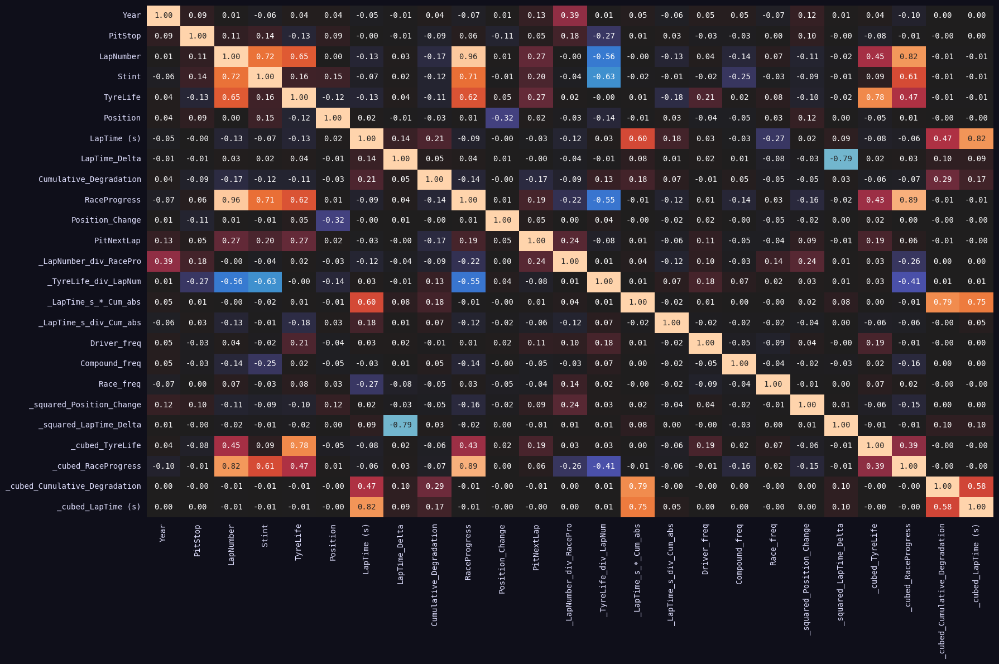

In [34]:
plt.figure(figsize=(18, 12))
sns.heatmap(train.select_dtypes(include='number').corr(),
            annot=True, cbar=False, fmt='.2f', center=0)

plt.tight_layout()
plt.show()

In [35]:
FEATURES = [c for c in train.columns if c not in ['id', TARGET]]
print('Total Features:', len(FEATURES))

train.head(3)

Total Features: 37


,Driver,Compound,Race,Year,PitStop,LapNumber,Stint,TyreLife,Position,LapTime (s),LapTime_Delta,Cumulative_Degradation,RaceProgress,Position_Change,PitNextLap,Bi_Year-|-Compound,Bi_Year-|-Stint,Bi_Year-|-Race,Bi_Year-|-PitStop,Bi_Compound-|-Stint,Bi_Compound-|-Race,Bi_Compound-|-PitStop,Bi_Stint-|-Race,Bi_Stint-|-PitStop,Bi_Race-|-PitStop,_LapNumber_div_RacePro,_TyreLife_div_LapNum,_LapTime_s_*_Cum_abs,_LapTime_s_div_Cum_abs,Driver_freq,Compound_freq,Race_freq,_squared_Position_Change,_squared_LapTime_Delta,_cubed_TyreLife,_cubed_RaceProgress,_cubed_Cumulative_Degradation,_cubed_LapTime (s)
0,D109,HARD,Canadian Grand Prix,2022,0,50,2,39.0,8,78.491,-7.564,21.019,0.714286,5.0,1,2022_HARD,2022_2,2022_Canadian Grand Prix,2022_0,HARD_2,HARD_Canadian Grand Prix,HARD_0,2_Canadian Grand Prix,2_0,Canadian Grand Prix_0,69.999901,0.780000,1649.802368,3.734288,0.002034,0.395496,0.048945,25.0,57.214096,59319.0,0.364431,9.286160e+03,483570.263325
1,D086,HARD,Dutch Grand Prix,2025,1,27,2,7.0,4,75.095,-32.617,-223.207,0.346154,-3.0,0,2025_HARD,2025_2,2025_Dutch Grand Prix,2025_1,HARD_2,HARD_Dutch Grand Prix,HARD_1,2_Dutch Grand Prix,2_1,Dutch Grand Prix_1,77.999771,0.259259,16761.730469,0.336437,0.002207,0.395496,0.055289,9.0,1063.868689,343.0,0.041477,-1.112048e+07,423480.156482
2,ZON,HARD,Austrian Grand Prix,2022,0,59,3,22.0,13,70.945,-7.540,-100.529,0.819444,3.0,1,2022_HARD,2022_3,2022_Austrian Grand Prix,2022_0,HARD_3,HARD_Austrian Grand Prix,HARD_0,3_Austrian Grand Prix,3_0,Austrian Grand Prix_0,71.999908,0.372881,7132.029785,0.705717,0.002893,0.395496,0.047861,9.0,56.851600,10648.0,0.550248,-1.015954e+06,357079.879159


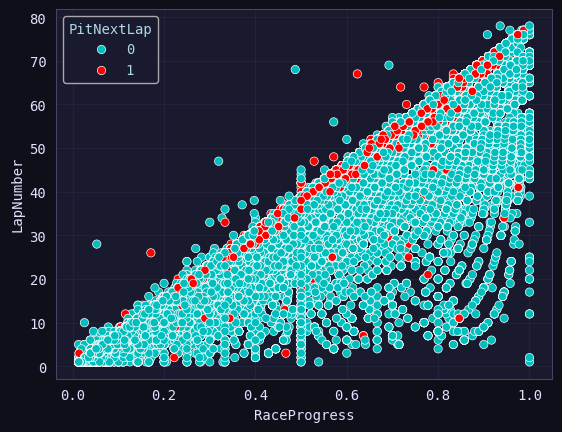

In [36]:
sns.scatterplot(data=train, x='RaceProgress', y='LapNumber', hue=TARGET)
plt.show()

# ML TRAINING

In [37]:
try:
    from venn_abers import VennAbersCalibrator
except:
    %pip install -q venn-abers
    from venn_abers import VennAbersCalibrator

  Preparing metadata (setup.py) ... done
Note: you may need to restart the kernel to use updated packages.


In [38]:
def Trainer_CV(model_name, params, train_df, test_df, features, target, kf,
               one_hot_cats=None, drop='first', with_mean=True):

    print(f"\n========== Starting Cross-Validation for {model_name} ==========")
    start = time()
    
    X = train_df[features]
    y = train_df[target]

    oof_preds   = np.zeros(len(X))
    test_preds  = np.zeros(len(test_df))
    fold_scores = []
    knn_scores  = []

    binary_cols = [c for c in features if X[c].nunique() == 2]

    for idx, (train_idx, val_idx) in enumerate(kf.split(X, y)):
        print(f"\n***** FOLD {idx+1}/{kf.n_splits} - ", end='')

        # Split data for the current fold
        X_train, X_valid = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_valid = y.iloc[train_idx], y.iloc[val_idx]
        X_test = test_df[features].copy()

        ## -- OPTION A: Concatenate original data --
        X_train = pd.concat([X_train, orig[features]], ignore_index=True)
        y_train = pd.concat([y_train, orig[target]], ignore_index=True)

        # ## -- OPTION B: TE Merge original data --
        # X_train, X_valid, X_test, NEW_COLS = orig_TE_data_propagate(
        #     orig,
        #     X_train,
        #     X_valid,
        #     X_test,
        #     features=BASE,
        #     target=TARGET,
        #     aggs=['mean'], # mean, median, count, std, nunique, max, min
        #     fill_nan=True,
        # )

        # print(f"Category Mean Encoding: {len(cme_features)} | ", end='')
        # cme_enc = CategoryMeanTransformer(cat_cols=[c])
        # X_train[n] = cme_enc.fit_transform(X_train, y_train)
        # X_valid[n] = cme_enc.transform(X_valid)
        # X_test[n]  = cme_enc.transform(X_test)

        ## -- TE Opt1. -> Using CUSTOM --
        te_enc  = TargetEncoder(INTER, cv=5, smooth='auto', aggs=['mean'], drop_original=True)
        X_train = te_enc.fit_transform(X_train, y_train)
        X_valid = te_enc.transform(X_valid)
        X_test  = te_enc.transform(X_test)

        te_enc_1 = TargetEncoder(['Driver'],cv=5,smooth='auto',aggs=['mean'],drop_original=True)
        X_train  = te_enc_1.fit_transform(X_train, y_train) 
        X_valid  = te_enc_1.transform(X_valid)
        X_test   = te_enc_1.transform(X_test)

        # te_enc_2 = TargetEncoder(['Race'], cv=5, smooth='auto', aggs=['mean'], drop_original=False)
        # X_train  = te_enc_2.fit_transform(X_train, y_train) 
        # X_valid  = te_enc_2.transform(X_valid)
        # X_test   = te_enc_2.transform(X_test)

        te_features = [c for c in X_train.columns if c.startswith('TE_')]
        binary_cols = [c for c in X_train.columns if X_train[c].nunique() == 2]

        no_scale_cols = one_hot_cats+te_features+binary_cols+['RaceProgress']+freq_cols
        scale_cols = [c for c in X_train.columns if c not in no_scale_cols]
        
        scaler_enc = StandardScaler() if with_mean else StandardScaler(with_mean=False)
        one_h_enc  = OneHotEncoder(handle_unknown='ignore',sparse_output=False,drop=drop,dtype=np.int8)
        col_trans  = ColumnTransformer(
            [('ohe', one_h_enc, one_hot_cats), ('scaled', scaler_enc, scale_cols)],
            remainder='passthrough', n_jobs=os.cpu_count(),
        )

        ## -- Internal split for calibration --
        X_base, X_calib, y_base, y_calib = train_test_split(
            X_train, y_train, train_size=0.7, stratify=y_train, random_state=CFG.SEED
        )
        if 'knn' in model_name:
            print(f"Train shape: {X_base.shape} *****")

            ## -- Create pipeline --
            model = Pipeline([('col_trans', col_trans), (model_name, KNeighborsClassifier(**params))])
            model.fit(X_base, y_base)
            print(f"--> Total features used by KNN: {len(model[:-1].get_feature_names_out())}")

            ## -- Predict on validation and test sets --
            oof_base = model.predict_proba(X_valid)[:, 1]
            oof_preds[val_idx] = oof_base
            test_preds += model.predict_proba(X_test)[:, 1]

            ## -- Calculate and print fold score --
            knn_auc = roc_auc_score(y_valid, oof_base)
            knn_scores.append(knn_auc)

            print(f'--> Calibrating with venn-abers... ', end='')
            p_cal   = model.predict_proba(X_calib)
            p_valid = model.predict_proba(X_valid)
            p_test  = model.predict_proba(X_test)

            ## Get calibrated OOF predictions --
            vao = VennAbersCalibrator() 
            oof_calib = vao.predict_proba(p_cal=p_cal, y_cal=y_calib.to_numpy(), p_test=p_valid)[:, 1]
            oof_preds[val_idx] = oof_calib

            ## Get calibrated TEST predictions --
            vat = VennAbersCalibrator() 
            test_calib = vat.predict_proba(p_cal=p_cal, y_cal=y_calib.to_numpy(), p_test=p_test)[:, 1]
            test_preds += test_calib

            ## -- Calculate and print fold score --
            calib_auc = roc_auc_score(y_valid, oof_calib)
            fold_scores.append(calib_auc)
            print(f'✓ Finished!')
            print(f' • Fold {idx+1} auc: knn -> {knn_auc:.5f} | calib -> {calib_auc:.5f}')

        elif 'mlp' in model_name:
            print(f"Train shape: {X_train.shape} *****")
            ## -- Create pipeline --
            model = Pipeline([('col_trans', col_trans), (model_name, MLPClassifier(**params))])
            model.fit(X_train, y_train)
            print(f"--> Total features used by MLP: {len(model[:-1].get_feature_names_out())}")
    
            ## -- Predict on validation and test sets --
            oof_preds[val_idx] = model.predict_proba(X_valid)[:, 1]
            test_preds += model.predict_proba(X_test)[:, 1]

            ## -- Calculate and print fold score --
            fold_auc = roc_auc_score(y_valid, oof_preds[val_idx])
            fold_scores.append(fold_auc)
            print(f' • Fold {idx+1} auc: {fold_auc:.5f}')
        else:
            print(f"Train shape: {X_train.shape} *****")
            ## -- Create pipeline --
            model = Pipeline([('col_trans', col_trans), (model_name, LogisticRegressionCV(**params))])
            model.fit(X_train, y_train)
            print(f"--> Total features used by LOGISTIC: {len(model[:-1].get_feature_names_out())}")

            ## -- Predict on validation and test sets --
            oof_preds[val_idx] = model.predict_proba(X_valid)[:, 1]
            test_preds += model.predict_proba(X_test)[:, 1]

            ## -- Calculate and print fold score --
            fold_auc = roc_auc_score(y_valid, oof_preds[val_idx])
            fold_scores.append(fold_auc)
            print(f' • Fold {idx+1} auc: {fold_auc:.5f}')

        ## -- Clean up memory -- X_valid, X_train
        # del y_train, y_valid, X_test
        gc.collect()

    ## -- Average the test predictions
    test_preds /= kf.n_splits

    ## -- Print final cross-validation results
    print("\n==================================================")
    print(f"Cross-Validation Results for {model_name}")
    print("==================================================")

    for i, score in enumerate(fold_scores):
        print(f" • Fold {i+1} score: {score:.5f}")

    ## -- Calculate final out-of-fold AUC
    oof_auc = np.round(roc_auc_score(y, oof_preds), 5)

    print("-------------------------------------------------|")
    print(f"Overall AUC: {oof_auc}")
    print(f"Average AUC: {np.mean(fold_scores):.5f} ± {np.std(fold_scores):.5f}")
    print("-------------------------------------------------|")
    if 'knn' in model_name:
        print(f"Avg.knn AUC: {np.mean(knn_scores):.5f} ± {np.std(knn_scores):.5f}")

    if 'log' in model_name:
        print(f"Best C: {model[-1].C_}")
    print(f'{((time() - start) / 60):.2f} mins\n')

    return {
        'oof_preds': oof_preds,
        'test_preds': test_preds,
        'score': oof_auc,
        'model': model,
        'data': [X_train, X_valid],
    }

print('⚙️ Training function ready ⚙️')

⚙️ Training function ready ⚙️


In [39]:
all_model_predictions = {}

MULTI_SEEDS  = [CFG.SEED] # CFG.SEED, 777, 1234, 24611, 0
ONE_HOT_COLS = ['Compound', 'Race'] + ['Year', 'Stint']

kf = StratifiedKFold(n_splits=CFG.FOLDS, shuffle=True, random_state=CFG.SEED)

kf

StratifiedKFold(n_splits=5, random_state=42, shuffle=True)

In [40]:
## ========== LOGISTIC ===========
version_name = 'log_orig_'

PARAMS = {
    'max_iter': 5000,
    # 'Cs': [c for c in np.arange(.01, .1, .01)],
    # 'cv': 3,
    # 'class_weight': 'balanced',
    # 'scoring': 'roc_auc', # 'roc_auc', 'neg_log_loss'
    'tol': 1e-4,
    'verbose': 0,
    'n_jobs': os.cpu_count(),
    'random_state': CFG.SEED,
}

for drop_type in ['first', None]: #
    n = version_name + str(drop_type)
    all_model_predictions[n] = Trainer_CV(
        model_name=n,
        params=PARAMS,
        train_df=train,
        test_df=test,
        features=FEATURES,
        target=TARGET,
        kf=kf,
        drop=drop_type,
        with_mean=False,
        one_hot_cats=ONE_HOT_COLS,
    )


========== Starting Cross-Validation for log_orig_first ==========

***** FOLD 1/5 - Train shape: (452683, 37) *****
--> Total features used by LOGISTIC: 75
 • Fold 1 auc: 0.92388

***** FOLD 2/5 - Train shape: (452683, 37) *****
--> Total features used by LOGISTIC: 75
 • Fold 2 auc: 0.92001

***** FOLD 3/5 - Train shape: (452683, 37) *****
--> Total features used by LOGISTIC: 75
 • Fold 3 auc: 0.92277

***** FOLD 4/5 - Train shape: (452683, 37) *****
--> Total features used by LOGISTIC: 75
 • Fold 4 auc: 0.92165

***** FOLD 5/5 - Train shape: (452683, 37) *****
--> Total features used by LOGISTIC: 75
 • Fold 5 auc: 0.92228

Cross-Validation Results for log_orig_first
 • Fold 1 score: 0.92388
 • Fold 2 score: 0.92001
 • Fold 3 score: 0.92277
 • Fold 4 score: 0.92165
 • Fold 5 score: 0.92228
-------------------------------------------------|
Overall AUC: 0.92211
Average AUC: 0.92212 ± 0.00128
-------------------------------------------------|
Best C: [0.04641589]
10.25 mins


=========

In [41]:
## ===== K-NEIGHBORS ======
version_name = 'knn_orig_'

PARAMS = {
    'n_neighbors': 10, 
    'weights': 'uniform',
    # 'leaf_size': 30,
    'n_jobs': os.cpu_count(),
}

for drop_type in ['first', None]:
    n = version_name + 'uni_' + str(drop_type)
    all_model_predictions[n] = Trainer_CV(
        model_name=n,
        params=PARAMS,
        train_df=train,
        test_df=test,
        features=FEATURES,
        target=TARGET,
        kf=kf,
        drop=drop_type,
        with_mean=False,
        one_hot_cats=ONE_HOT_COLS,
    )


PARAMS['weights'] = 'distance'
for drop_type in ['first', None]:
    n = version_name + 'dis_' + str(drop_type)
    all_model_predictions[n] = Trainer_CV(
        model_name=n,
        params=PARAMS,
        train_df=train,
        test_df=test,
        features=FEATURES,
        target=TARGET,
        kf=kf,
        drop=drop_type,
        with_mean=False,
        one_hot_cats=ONE_HOT_COLS,
    )


========== Starting Cross-Validation for knn_orig_uni_first ==========

***** FOLD 1/5 - Train shape: (316878, 37) *****
--> Total features used by KNN: 75
--> Calibrating with venn-abers... ✓ Finished!
 • Fold 1 auc: knn -> 0.91904 | calib -> 0.91904

***** FOLD 2/5 - Train shape: (316878, 37) *****
--> Total features used by KNN: 75
--> Calibrating with venn-abers... ✓ Finished!
 • Fold 2 auc: knn -> 0.91464 | calib -> 0.91464

***** FOLD 3/5 - Train shape: (316878, 37) *****
--> Total features used by KNN: 75
--> Calibrating with venn-abers... ✓ Finished!
 • Fold 3 auc: knn -> 0.91609 | calib -> 0.91609

***** FOLD 4/5 - Train shape: (316878, 37) *****
--> Total features used by KNN: 75
--> Calibrating with venn-abers... ✓ Finished!
 • Fold 4 auc: knn -> 0.91545 | calib -> 0.91545

***** FOLD 5/5 - Train shape: (316878, 37) *****
--> Total features used by KNN: 75
--> Calibrating with venn-abers... ✓ Finished!
 • Fold 5 auc: knn -> 0.91734 | calib -> 0.91734

Cross-Validation Resul

In [42]:
# Cross-Validation Results for knn_v0_uni_first
# ==================================================
#  • Fold 1 auc: 0.92162
#  • Fold 2 auc: 0.91708
#  • Fold 3 auc: 0.91898
#  • Fold 4 auc: 0.91853
#  • Fold 5 auc: 0.91965
# -------------------------------------------------|
# Overall AUC: 0.91899
# Average AUC: 0.91917 ± 0.00149
# -------------------------------------------------|
# Avg.knn AUC: 0.91917 ± 0.00149
# 66.35 mins

# Cross-Validation Results for knn_dis_first
# ==================================================
#  • Fold 1 auc: 0.92251
#  • Fold 2 auc: 0.91775
#  • Fold 3 auc: 0.91976
#  • Fold 4 auc: 0.91915
#  • Fold 5 auc: 0.91985
# -------------------------------------------------|
# Overall AUC: 0.91953
# Average AUC: 0.91980 ± 0.00155
# -------------------------------------------------|
# Avg.knn AUC: 0.91985 ± 0.00155
# 57.78 mins

In [43]:
## ========== MLP ===========
version_name = 'mlp_orig_'

PARAMS = {
    'max_iter': 300,
    'tol': 1e-4,
    'random_state': CFG.SEED,
}

for drop_type in ['first', None]: 
    n = version_name + str(drop_type)
    all_model_predictions[n] = Trainer_CV(
        model_name=n,
        params=PARAMS,
        train_df=train,
        test_df=test,
        features=FEATURES,
        target=TARGET,
        kf=kf,
        drop=drop_type,
        with_mean=False,
        one_hot_cats=ONE_HOT_COLS,
    )


========== Starting Cross-Validation for mlp_orig_first ==========

***** FOLD 1/5 - Train shape: (452683, 37) *****
--> Total features used by MLP: 75
 • Fold 1 auc: 0.94330

***** FOLD 2/5 - Train shape: (452683, 37) *****
--> Total features used by MLP: 75
 • Fold 2 auc: 0.94132

***** FOLD 3/5 - Train shape: (452683, 37) *****
--> Total features used by MLP: 75
 • Fold 3 auc: 0.94260

***** FOLD 4/5 - Train shape: (452683, 37) *****
--> Total features used by MLP: 75
 • Fold 4 auc: 0.94158

***** FOLD 5/5 - Train shape: (452683, 37) *****
--> Total features used by MLP: 75
 • Fold 5 auc: 0.94177

Cross-Validation Results for mlp_orig_first
 • Fold 1 score: 0.94330
 • Fold 2 score: 0.94132
 • Fold 3 score: 0.94260
 • Fold 4 score: 0.94158
 • Fold 5 score: 0.94177
-------------------------------------------------|
Overall AUC: 0.94161
Average AUC: 0.94211 ± 0.00073
-------------------------------------------------|
80.56 mins


========== Starting Cross-Validation for mlp_orig_None 

In [44]:
# freq | arith | poly | INTER ======================
# Cross-Validation Results for mlp_v0_first (351312, 37)
# ==================================================
#  • Fold 1 auc: 0.94350
#  • Fold 2 auc: 0.94185
#  • Fold 3 auc: 0.94280
#  • Fold 4 auc: 0.94269
#  • Fold 5 auc: 0.94245
# -------------------------------------------------|
# Overall AUC: 0.94244
# Average AUC: 0.94266 ± 0.00054
# -------------------------------------------------|
# 14.11 mins

# _ = all_model_predictions[list(all_model_predictions.keys())[0]]
# __ = _['model'][:-1].transform(_['data'][0])
# __.head()

In [45]:
__.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Columns: 38 entries, Driver to _cubed_LapTime (s)
dtypes: float32(7), float64(12), int64(6), object(13)
memory usage: 960.0+ bytes


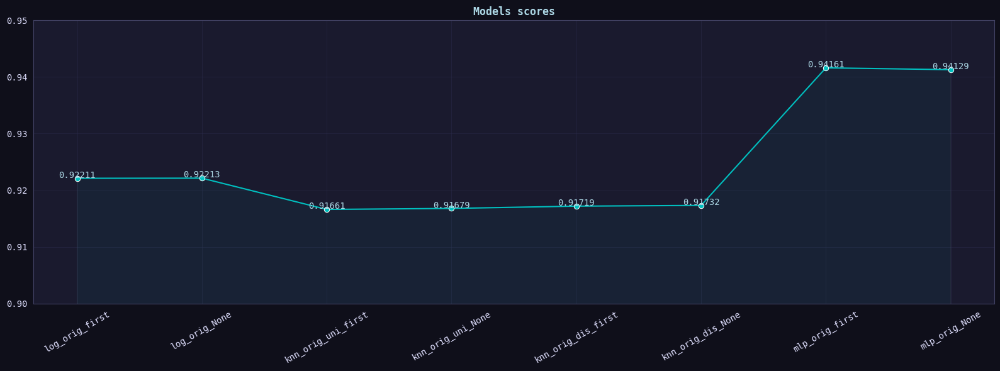

In [46]:
## -- Get Scores --
all_model_scores = {}
all_scores = []

for k, v in all_model_predictions.items():
    for x, y in v.items():
        if x == 'score':
            all_model_scores[k] = y
            all_scores.append(float(y))

plt.figure(figsize=(16, 6))
ax = sns.lineplot(all_model_scores, marker='o')

ax.fill_between(range(len(all_model_scores)), all_model_scores.values(), alpha=0.05)
ax.set_title('Models scores', fontweight='semibold')
ax.tick_params('x', rotation=30)
ax.set_ylim(0.9, 0.95)

for i, s in enumerate(all_model_scores.values()):
    ax.text(float(i), s+1e-4, s, ha='center', va='baseline')

plt.tight_layout()
plt.show()

In [47]:
pd.Series(all_model_scores).sort_values()

knn_orig_uni_first    0.91661
knn_orig_uni_None     0.91679
knn_orig_dis_first    0.91719
knn_orig_dis_None     0.91732
log_orig_first        0.92211
log_orig_None         0.92213
mlp_orig_None         0.94129
mlp_orig_first        0.94161
dtype: float64

log_orig_first_92211 saved!


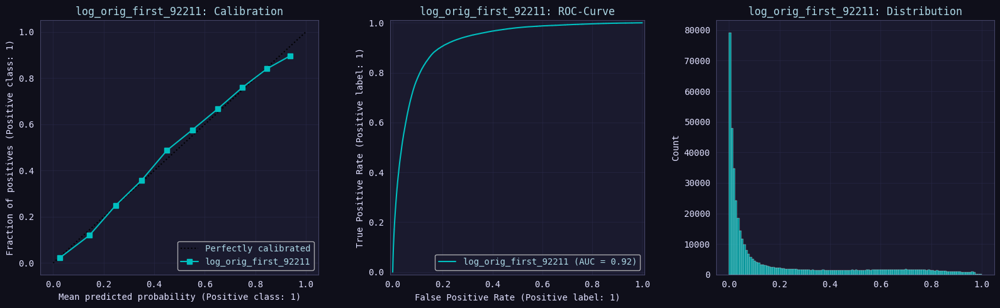


log_orig_None_92213 saved!


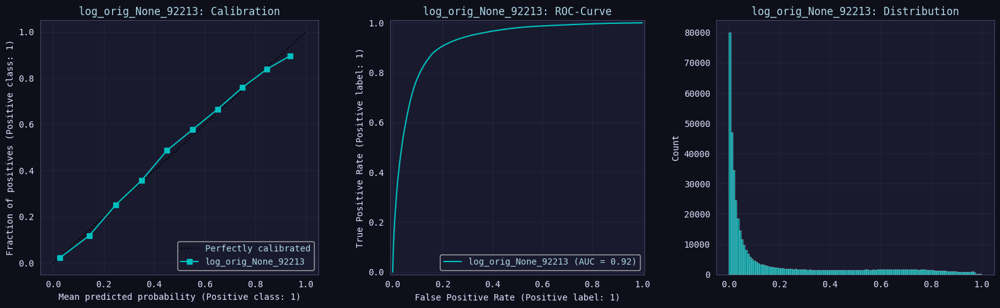


knn_orig_uni_first_91661 saved!


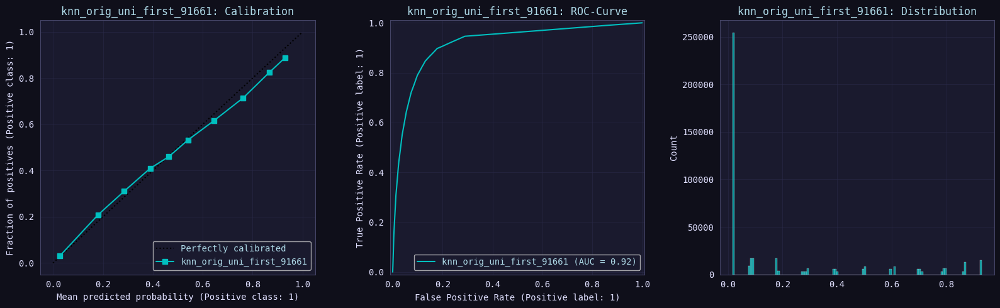


knn_orig_uni_None_91679 saved!


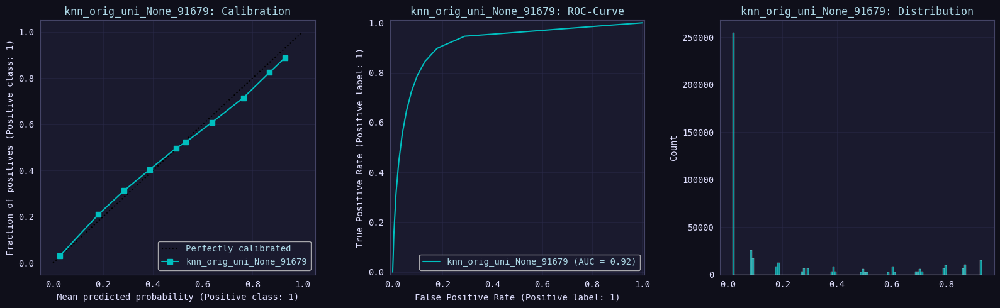


knn_orig_dis_first_91719 saved!


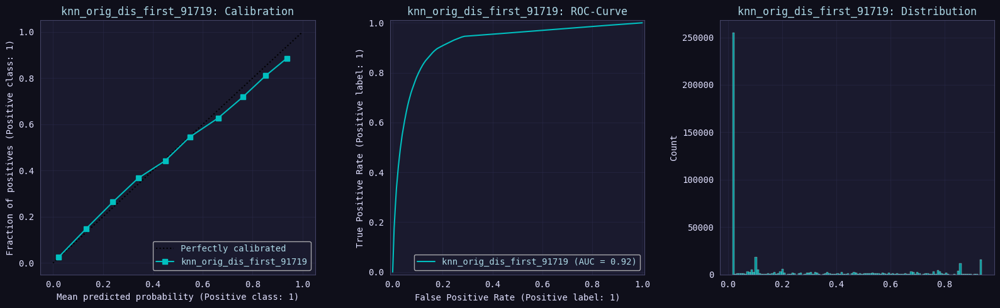


knn_orig_dis_None_91732 saved!


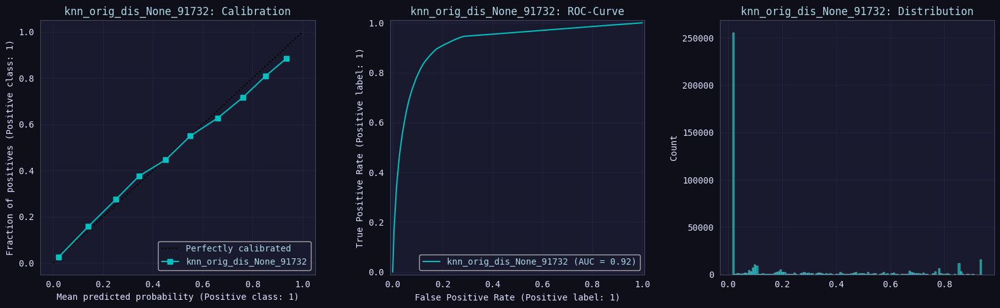


mlp_orig_first_94161 saved!


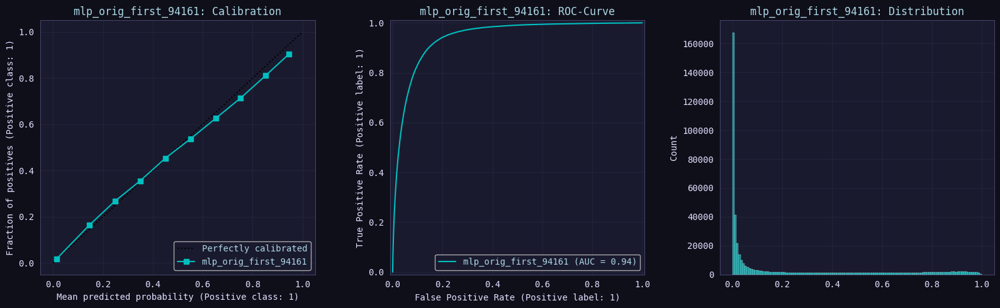


mlp_orig_None_94129 saved!


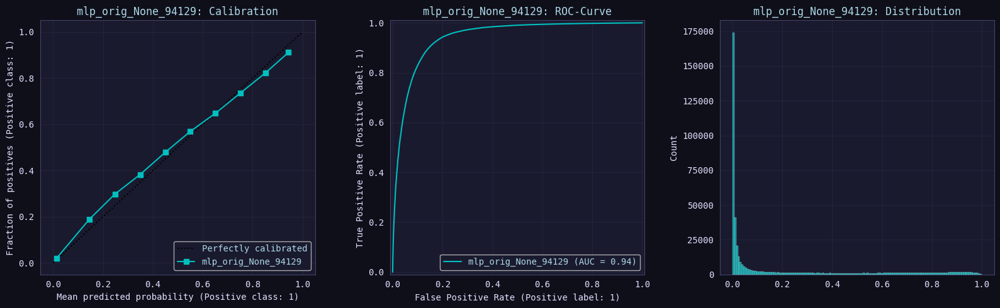

In [48]:
## -- Get oof predictions --
oof_predictions = []

for i, (k, v) in enumerate(all_model_predictions.items()):
    for key_, data_ in v.items():
        if key_ == 'oof_preds':
            ## -- Save oof predictions --
            n = f"{k}_{str(all_scores[i]).split('.')[1]}"
            np.save(f"oof_{n}.npy", data_)
            print(f'{n} saved!')

            ## -- Plot oof distributions --
            _, axs = plt.subplots(1, 3, figsize=(16, 5)) 
            CalibrationDisplay.from_predictions(train[TARGET], data_, n_bins=10, name=n, ax=axs[0])
            axs[0].set_title(f"{n}: Calibration")

            RocCurveDisplay.from_predictions(train[TARGET], data_, name=n, ax=axs[1])
            axs[1].set_title(f"{n}: ROC-Curve")

            sns.histplot(data_, ax=axs[2])
            axs[2].set_title(f"{n}: Distribution")
            
            plt.tight_layout()
            plt.show()

            print()

In [49]:
## -- Save test predictions/submissions --
model_results = {}

for i, (k, v) in enumerate(all_model_predictions.items()):
    for j, (x, y) in enumerate(v.items()):
        if x == 'test_preds':
            ## -- Base submission file --
            n = f"{k}_{str(all_scores[i]).split('.')[1]}"
            np.save(f"test_{n}.npy", y)

            submit[TARGET] = y
            submit.to_csv(f'submit_base_{n}.csv', index=False)
            print(f'{n} saved! {y.shape}')
            model_results[n] = y

print()
pd.DataFrame(model_results).head()

log_orig_first_92211 saved! (188165,)
log_orig_None_92213 saved! (188165,)
knn_orig_uni_first_91661 saved! (188165,)
knn_orig_uni_None_91679 saved! (188165,)
knn_orig_dis_first_91719 saved! (188165,)
knn_orig_dis_None_91732 saved! (188165,)
mlp_orig_first_94161 saved! (188165,)
mlp_orig_None_94129 saved! (188165,)



,log_orig_first_92211,log_orig_None_92213,knn_orig_uni_first_91661,knn_orig_uni_None_91679,knn_orig_dis_first_91719,knn_orig_dis_None_91732,mlp_orig_first_94161,mlp_orig_None_94129
0,0.009557,0.008907,0.016880,0.017021,0.016786,0.016930,0.007503,0.003492
1,0.011622,0.012805,0.051833,0.051665,0.060976,0.061270,0.079797,0.040178
2,0.010234,0.009501,0.016880,0.017021,0.016786,0.016930,0.004970,0.003481
3,0.344461,0.343163,1.122369,0.833052,1.112261,0.799800,0.324954,0.402720
4,0.685167,0.679440,1.864364,1.864260,1.858014,1.859068,0.940397,0.930415


In [50]:
try:
    import shap
except:
    %pip install -q -U shap
    import shap

print(f"Shap version: {shap.__version__}")

Shap version: 0.50.0


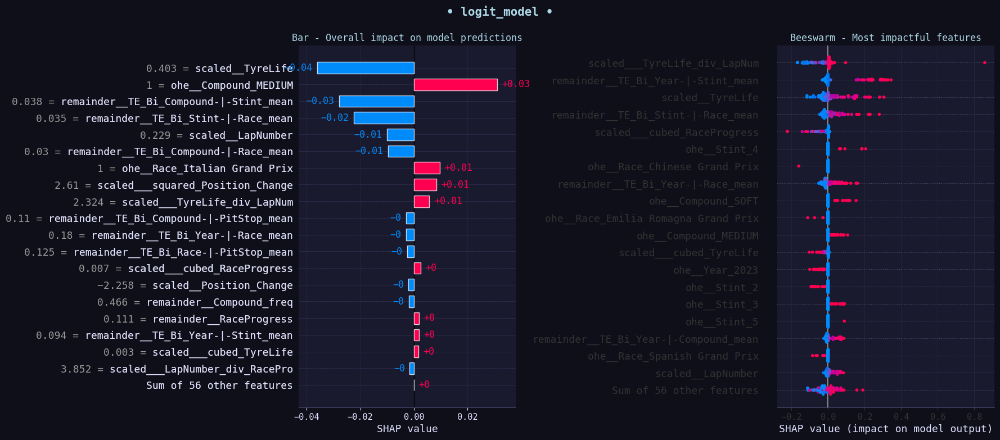

PermutationExplainer explainer: 101it [01:30,  1.01s/it]


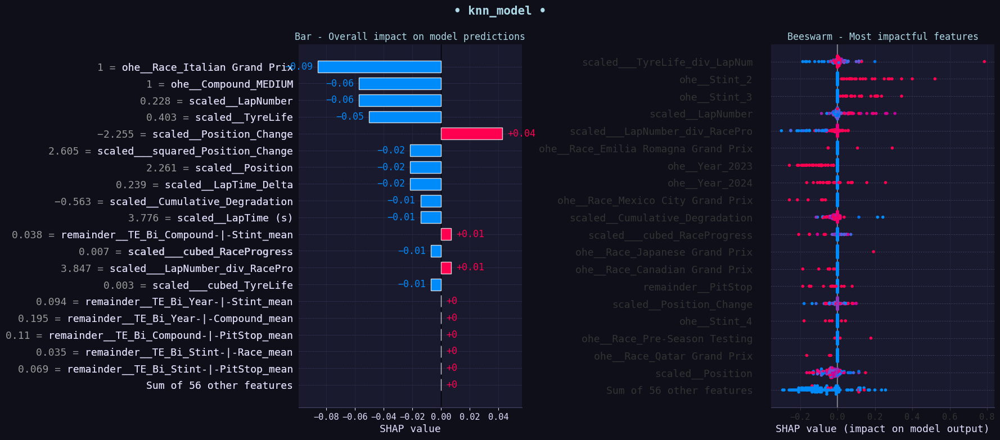

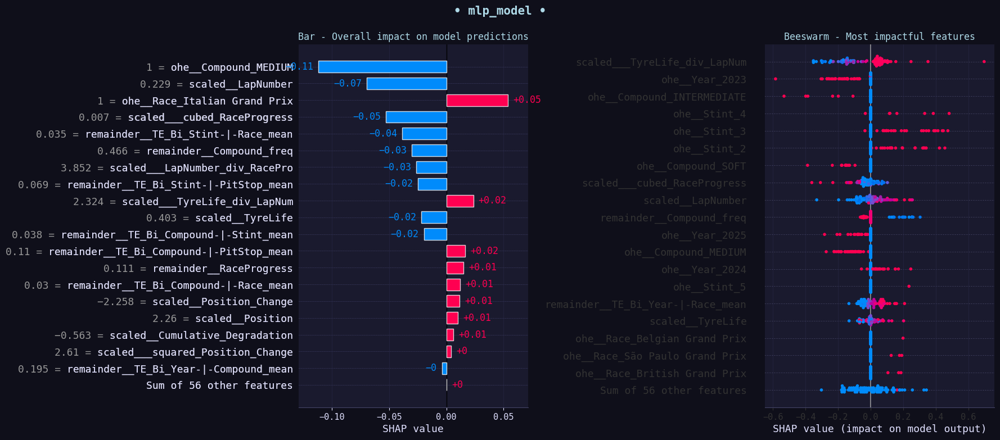

In [51]:
## -- SHAP values: Feature Importances--
log_ = all_model_predictions[list(all_model_predictions.keys())[0]]
knn_ = all_model_predictions[list(all_model_predictions.keys())[2]]
mlp_ = all_model_predictions[list(all_model_predictions.keys())[-2]]

model_names = ['• logit_model •', '• knn_model •', '• mlp_model •']
max_display = 20

for i, m in enumerate([log_, knn_, mlp_]):
    model   = m['model'][-1]
    x_train = m['model'][:-1].transform(m['data'][0])
    x_valid = m['model'][:-1].transform(m['data'][1])

    ## -- Shap Explainer --
    def f(x):
        return model.predict_proba(x)[:, 1]

    x_med = x_train.median().values.reshape((1, x_train.shape[1]))
    explainer = shap.Explainer(f, x_med)
    explanation = explainer(x_valid.iloc[:100])

    ## -- Bar plot --
    plt.subplot(121)
    shap.plots.bar(explanation[0], max_display=max_display, show=False)
    plt.title('Bar - Overall impact on model predictions')

    ## -- Beeswarm plot --
    plt.subplot(122)
    shap.plots.beeswarm(
        explanation, order=explanation.abs.max(0), plot_size=(18, 8),
        max_display=max_display, color_bar=False, show=False)
    plt.title('Beeswarm - Most impactful features')

    plt.suptitle(model_names[i], fontsize=15, fontweight='semibold')
    plt.tight_layout(pad=1.5)
    plt.show()
    print()

# HILLCLIMB

In [52]:
try:
    from hillclimbers import climb_hill, partial
except:
    %pip install -q -U hillclimbers
    from hillclimbers import climb_hill, partial

## -- Load data --
oof_df = pd.DataFrame()
test_df = pd.DataFrame()

print('Loading data: ', end='')
for (root, dirs, files) in os.walk('/kaggle/working'):
    for i, file in enumerate(sorted(files), 1):
        if i%5 == 0: print(f'{i}%.. ', end='')
        if file.endswith('.npy') and 'oof' in file:
            oof_df = pd.concat([oof_df, pd.Series(np.load(os.path.join(root, file)),
                                name=file[4:-4])], axis=1)
        elif file.endswith('.npy') and 'test' in file:
            test_df = pd.concat([test_df, pd.Series(np.load(os.path.join(root, file)),
                                name=file[5:-4])], axis=1)

print(CFG.YELLOW)
print(f"OOF  loaded : {oof_df.shape}")
print(f"TEST loaded : {test_df.shape}")

display(oof_df.head())
display(test_df.head())

  Preparing metadata (setup.py) ... done
Note: you may need to restart the kernel to use updated packages.
Loading data: 5%.. 10%.. 15%.. 20%.. 25%.. 
OOF  loaded : (439140, 8)
TEST loaded : (188165, 8)


,knn_orig_dis_None_91732,knn_orig_dis_first_91719,knn_orig_uni_None_91679,knn_orig_uni_first_91661,log_orig_None_92213,log_orig_first_92211,mlp_orig_None_94129,mlp_orig_first_94161
0,0.783483,0.706912,0.797551,0.698075,0.752221,0.753896,0.848892,0.610443
1,0.766985,0.765938,0.794609,0.795646,0.271443,0.271571,0.504113,0.636864
2,0.793321,0.629630,0.786311,0.610368,0.521061,0.517546,0.737085,0.366221
3,0.016751,0.016620,0.016872,0.016730,0.001198,0.001212,0.000010,0.000043
4,0.083022,0.075113,0.082026,0.080459,0.349037,0.336026,0.460929,0.151199


,knn_orig_dis_None_91732,knn_orig_dis_first_91719,knn_orig_uni_None_91679,knn_orig_uni_first_91661,log_orig_None_92213,log_orig_first_92211,mlp_orig_None_94129,mlp_orig_first_94161
0,0.016930,0.016786,0.017021,0.016880,0.008907,0.009557,0.003492,0.007503
1,0.061270,0.060976,0.051665,0.051833,0.012805,0.011622,0.040178,0.079797
2,0.016930,0.016786,0.017021,0.016880,0.009501,0.010234,0.003481,0.004970
3,0.799800,1.112261,0.833052,1.122369,0.343163,0.344461,0.402720,0.324954
4,1.859068,1.858014,1.864260,1.864364,0.679440,0.685167,0.930415,0.940397


In [53]:
%%time

trn = pd.read_csv(PATH+'train.csv').drop(columns=['id'])

pred_hc, oof_hc = climb_hill(
                               train = trn,
                              target = TARGET,
                         oof_pred_df = oof_df,
                        test_pred_df = test_df,
                           objective = 'maximize',
                         eval_metric = partial(roc_auc_score),
                    # negative_weights = True,
                    return_oof_preds = True,
                           precision = 0.01,
                           plot_hill = True,
                           plot_hist = True,
)

   /\  
  /__\  hillclimbers 
 /    \
/______\ 

Models to be ensembled | (8 total): 

mlp_orig_first_94161:     0.94161 (best solo model)
mlp_orig_None_94129:      0.94129
log_orig_None_92213:      0.92213
log_orig_first_92211:     0.92211
knn_orig_dis_None_91732:  0.91732
knn_orig_dis_first_91719: 0.91719
knn_orig_uni_None_91679:  0.91679
knn_orig_uni_first_91661: 0.91661

[Data preparation completed successfully] - [Initiate hill climbing] 

Iteration: 1 | Model added: mlp_orig_None_94129 | Best weight: 0.49 | Best roc_auc_score: 0.94382
Iteration: 2 | Model added: knn_orig_dis_first_91719 | Best weight: 0.16 | Best roc_auc_score: 0.94481
Iteration: 3 | Model added: log_orig_first_92211 | Best weight: 0.10 | Best roc_auc_score: 0.94522
Iteration: 4 | Model added: knn_orig_dis_None_91732 | Best weight: 0.01 | Best roc_auc_score: 0.94522


CPU times: user 2min 31s, sys: 1.82 s, total: 2min 33s
Wall time: 2min 34s


In [54]:
hc_auc = str(round(roc_auc_score(train[TARGET], oof_hc), 5)).split('.')[1]
print(f"Hillclimb score: {hc_auc}")

n = 'log-knn-mlp'
np.save(f"oof_{n}_hillclimb_{hc_auc}.npy", oof_hc)
np.save(f"test_{n}_hillclimb_{hc_auc}.npy", pred_hc)

submit[TARGET] = pred_hc
submit.to_csv(f"submit_{n}_hillclimb_{hc_auc}.csv", index=False)
print(f"\n✅ Saved hillclimb ensemble!!!")

submit.head(10)

Hillclimb score: 94522

✅ Saved hillclimb ensemble!!!


,id,PitNextLap
0,439140,0.007653
1,439141,0.055650
2,439142,0.006749
3,439143,0.472392
4,439144,1.051471
5,439145,0.153254
6,439146,0.006105
7,439147,0.004788
8,439148,0.036350
9,439149,0.003720
